# Library

In [1]:
import torch
import os
import glob
from IPython.display import Image, display

%cd yolov5
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

c:\Users\Gemi\Documents\FireDetection\yolov5
Setup complete. Using torch 2.6.0+cu118 (NVIDIA GeForce RTX 3050 6GB Laptop GPU)


# MELATIH MODEL

In [2]:
!python train.py --img 480 --batch 16 --epochs 100 --data ../fire.yaml --weights yolov5s.pt --patience 20 --workers 0

Error decoding JSON from C:\Users\Gemi\AppData\Roaming\Ultralytics\settings.json. Starting with an empty dictionary.
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at 'C:\Users\Gemi\AppData\Roaming\Ultralytics\settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Error decoding JSON from C:\Users\Gemi\AppData\Roaming\Ultralytics\persistent_cache.json. Starting with an empty dictionary.


train: weights=yolov5s.pt, cfg=, data=../fire.yaml, hyp=data\hyps\hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=480, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data\hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=0, project=runs\train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=20, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 
YOLOv5  v7.0-418-ga493afe1 Python-3.12.9 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 6144MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05

## EVALUASI MODEL

C:\Users\Gemi\AppData\Local\Temp\ipykernel_31264\569651807.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metrics_df[['metrics/precision', 'metrics/recall', 'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95']] *= 100


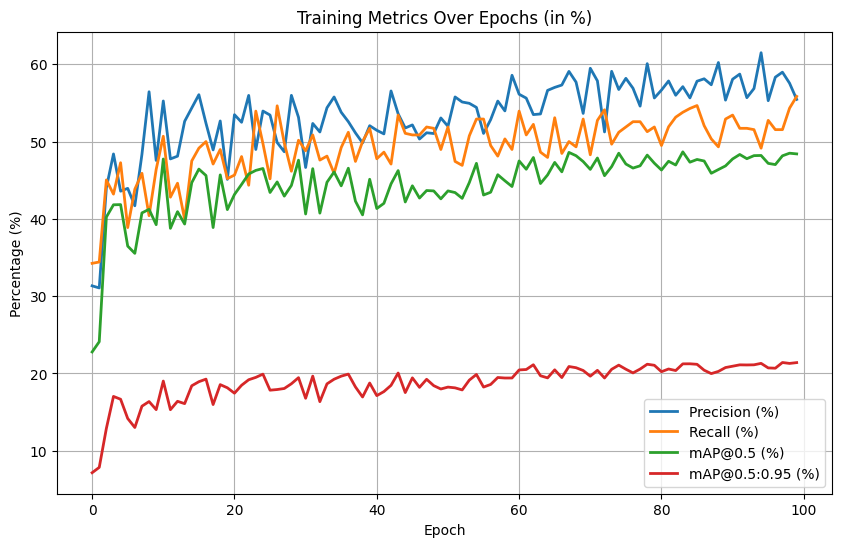

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Load CSV dengan membersihkan spasi pada nama kolom
df = pd.read_csv('runs/train/exp3/results.csv')
df.columns = df.columns.str.strip()  # Hapus spasi ekstra pada nama kolom

# Pilih kolom yang relevan
metrics_df = df[['epoch', 'metrics/precision', 'metrics/recall', 'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95']]

# Konversi ke persentase (0-100%)
metrics_df[['metrics/precision', 'metrics/recall', 'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95']] *= 100

# Plot line chart tanpa marker
plt.figure(figsize=(10, 6))
plt.plot(metrics_df['epoch'], metrics_df['metrics/precision'], label='Precision (%)', linestyle='-', linewidth=2)
plt.plot(metrics_df['epoch'], metrics_df['metrics/recall'], label='Recall (%)', linestyle='-', linewidth=2)
plt.plot(metrics_df['epoch'], metrics_df['metrics/mAP_0.5'], label='mAP@0.5 (%)', linestyle='-', linewidth=2)
plt.plot(metrics_df['epoch'], metrics_df['metrics/mAP_0.5:0.95'], label='mAP@0.5:0.95 (%)', linestyle='-', linewidth=2)

# Labeling dan styling
plt.xlabel('Epoch')
plt.ylabel('Percentage (%)')
plt.title('Training Metrics Over Epochs (in %)')
plt.legend()
plt.grid()
plt.show()

In [6]:
import pandas as pd

# Load CSV dengan membersihkan spasi pada nama kolom
df = pd.read_csv('runs/train/exp3/results.csv')
df.columns = df.columns.str.strip()  # Hapus spasi ekstra

# Pilih kolom yang relevan
metrics_df = df[['epoch', 'metrics/precision', 'metrics/recall', 'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95']]

# Tampilkan tabel dalam format bersih
print(metrics_df.to_string(index=False))

 epoch  metrics/precision  metrics/recall  metrics/mAP_0.5  metrics/mAP_0.5:0.95
     0            0.31334         0.34247          0.22783              0.071603
     1            0.31065         0.34418          0.24107              0.078516
     2            0.44014         0.45034          0.40232              0.128880
     3            0.48396         0.43198          0.41819              0.170300
     4            0.43582         0.47260          0.41844              0.166650
     5            0.43945         0.38870          0.36475              0.141770
     6            0.41693         0.43836          0.35538              0.130110
     7            0.48352         0.45890          0.40770              0.157690
     8            0.56441         0.40411          0.41233              0.163670
     9            0.47555         0.46404          0.39248              0.153210
    10            0.55248         0.50685          0.47743              0.190170
    11            0.47754   

### PREDIKSI PADA GAMBAR

In [41]:
!python detect.py --weights runs/train/exp3/weights/best.pt --img 640 --conf 0.25 --source ../datasets/fire/test/images/

detect: weights=['runs/train/exp3/weights/best.pt'], source=../datasets/fire/test/images/, data=data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-418-ga493afe1 Python-3.12.9 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 6144MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/549 C:\Users\Gemi\Documents\FireDetection\datasets\fire\test\images\fire.100.png: 384x640 1 fire, 67.3ms
image 2/549 C:\Users\Gemi\Documents\FireDetection\datasets\fire\test\images\fire.101.png: 480x640 1 fire, 71.5ms
image 3/549 C:\Users\Gemi\Documents\FireDetection\

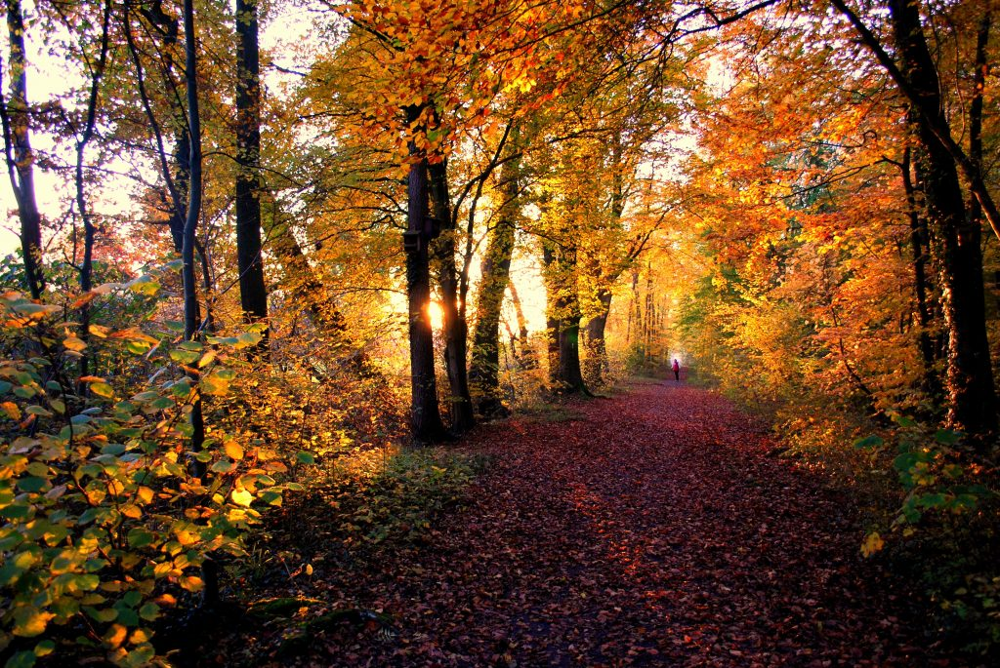

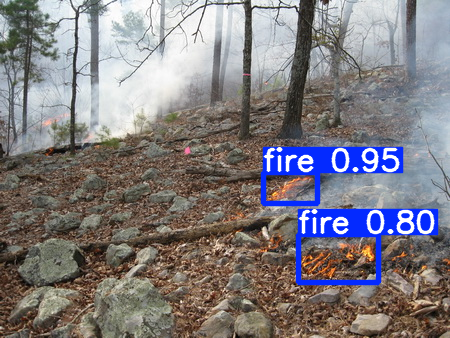

In [59]:
from IPython.display import display, Image

images = ['runs/detect/exp9/non_fire.115.png', 'runs/detect/exp9/fire.96.png']

for imageName in images:
    display(Image(filename=imageName, width=400))

### PREDIKSI PADA VIDEO

In [2]:
!python detect.py --weights runs/train/exp3/weights/best.pt --img 640 --conf 0.25 --source ../test2.mp4 

detect: weights=['runs/train/exp3/weights/best.pt'], source=../test2.mp4, data=data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-418-ga493afe1 Python-3.12.9 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 6144MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/560) C:\Users\Gemi\Documents\FireDetection\test2.mp4: 512x640 (no detections), 73.3ms
video 1/1 (2/560) C:\Users\Gemi\Documents\FireDetection\test2.mp4: 512x640 (no detections), 14.5ms
video 1/1 (3/560) C:\Users\Gemi\Documents\FireDetection\test2.mp4: 512x640 (no detections), 13.

In [4]:
import torch
import cv2
import time
from playsound import playsound
import threading

model = torch.hub.load('ultralytics/yolov5', 'custom', path='runs/train/exp/weights/best.pt', force_reload=True)
model.conf = 0.25  

video_path = 'runs/detect/exp7/test2.mp4'

alarm_path = '../alarm.wav'

def play_alarm():
    playsound(alarm_path)

cap = cv2.VideoCapture(video_path)
alarm_playing = False

if not cap.isOpened():
    print("Failed to open.")
else:
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        results = model(frame)
        labels = results.xyxyn[0][:, -1].cpu().numpy()

        if 0 in labels and not alarm_playing:
            threading.Thread(target=play_alarm, daemon=True).start()
            alarm_playing = True

        cv2.imshow('Fire Detection', frame)

        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    cap.release()
    cv2.destroyAllWindows()

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to C:\Users\Gemi/.cache\torch\hub\master.zip
YOLOv5  2025-6-13 Python-3.12.9 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 6144MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
C:\Users\Gemi/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\Gemi/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
C:\Users\Gemi/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


# VISUALISASI FEATURE MAP

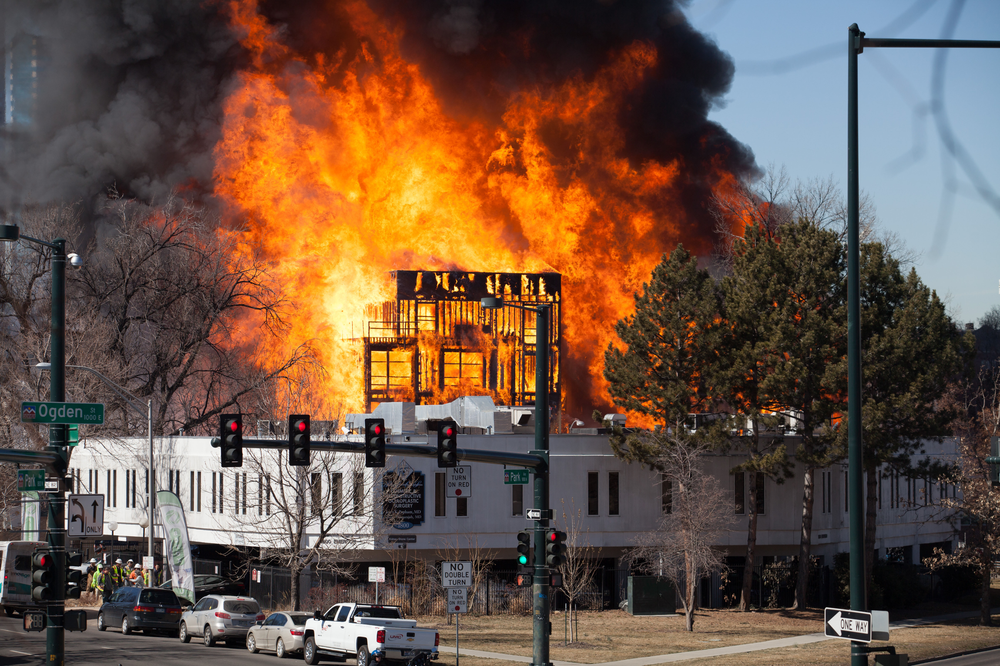

In [39]:
image_path = "../datasets/fire/val/images/20.jpg"
display(Image(filename=image_path, width=400))

In [40]:
!python detect.py --weights runs/train/exp3/weights/best.pt --img 640 --conf 0.25 --source {image_path} --visualize

detect: weights=['runs/train/exp3/weights/best.pt'], source=../datasets/fire/val/images/20.jpg, data=data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=True, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-418-ga493afe1 Python-3.12.9 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 6144MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Saving runs\detect\exp8\20\stage0_Conv_features.png... (32/32)
Saving runs\detect\exp8\20\stage1_Conv_features.png... (32/64)
Saving runs\detect\exp8\20\stage2_C3_features.png... (32/64)
Saving runs\detect\exp8\20\stage3_Conv_features.png... (32/128)
Saving runs\detect\ex

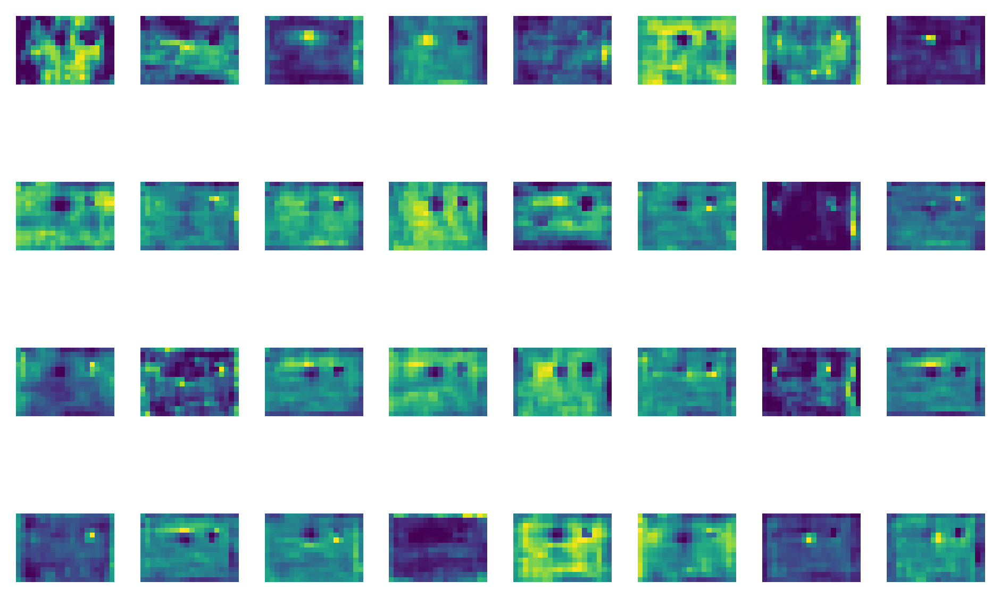

In [60]:
display(Image(filename="runs/detect/exp8/20/stage23_C3_features.png"))